In [113]:
import matplotlib.pyplot as plt
import maxflow
import numpy as np
from os import listdir
import pdb
from cv2 import imwrite
import random
from imageio import imread, imsave
from scipy.spatial.distance import cdist
import time
import os
import sys
import numpy as np
import cv2
import numpy as np 
from glob import glob
from sklearn.cluster import KMeans
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import argparse
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import classification_report

In [74]:
class ImageHelpers:
    def __init__(self):
        self.sift_object = cv2.xfeatures2d.SIFT_create()

    def gray(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        return gray

    def features(self, image):
        keypoints, descriptors = self.sift_object.detectAndCompute(image, None)
        return [keypoints, descriptors]


class BOVHelpers:
    def __init__(self, n_clusters = 20):
        self.n_clusters = n_clusters
        self.kmeans_obj = KMeans(n_clusters = n_clusters)
        self.kmeans_ret = None
        self.descriptor_vstack = None
        self.mega_histogram = None
        self.clf  = SVC()

    def cluster(self):
#cluster using KMeans algorithm
        self.kmeans_ret = self.kmeans_obj.fit_predict(self.descriptor_vstack)

    def developVocabulary(self,n_images, descriptor_list, kmeans_ret = None):

#Each cluster denotes a particular visual word Every image can be represeted as a combination of multiple  visual words. The best method is to generate a sparse histogram that contains the frequency of occurence of each visual word Thus the vocabulary comprises of a set of histograms of encompassing all descriptions for all images
        self.mega_histogram = np.array([np.zeros(self.n_clusters) for i in range(n_images)])
        old_count = 0
        for i in range(n_images):
            l = len(descriptor_list[i])
            for j in range(l):
                if kmeans_ret is None:
                    idx = self.kmeans_ret[old_count+j]
                else:
                    idx = kmeans_ret[old_count+j]
                self.mega_histogram[i][idx] += 1
            old_count += l
        print("Vocabulary Histogram Generated")

    def standardize(self, std=None):

#standardize is required to normalize the distribution wrt sample size and features. If not normalized, the classifier may become biased due to steep variances.
        if std is None:
            self.scale = StandardScaler().fit(self.mega_histogram)
            self.mega_histogram = self.scale.transform(self.mega_histogram)
        else:
            print("STD not none. External STD supplied")
            self.mega_histogram = std.transform(self.mega_histogram)

    def formatND(self, l):
        #restructures list into vstack array of shapeM samples x N features for sklearn
        vStack = np.array(l[0])
        for remaining in l[1:]:
            vStack = np.vstack((vStack, remaining))
        self.descriptor_vstack = vStack.copy()
        return vStack

    def train(self, train_labels):
        #uses sklearn.svm.SVC classifier (SVM) 
        print("Training SVM")
        #print(self.clf)
        #print("Train labels", train_labels)
        self.clf.fit(self.mega_histogram, train_labels)
        print("Training completed")

    def predict(self, iplist):
        predictions = self.clf.predict(iplist)
        return predictions

    def plotHist(self, vocabulary = None):
        print("Plotting histogram")
        if vocabulary is None:
            vocabulary = self.mega_histogram

        x_scalar = np.arange(self.n_clusters)
        y_scalar = np.array([abs(np.sum(vocabulary[:,h], dtype=np.int32)) for h in range(self.n_clusters)])

        #print(y_scalar)
        plt.figure(figsize=(10,10))
        plt.bar(x_scalar, y_scalar)
        plt.xlabel("Visual Word Index")
        plt.ylabel("Frequency")
        plt.title("Complete Vocabulary Generated")
        plt.xticks(x_scalar + 0.4, x_scalar)
        plt.show()

class FileHelpers:

    def __init__(self):
        pass

    def getFiles(self, path):

#- returns  a dictionary of all files  having key => value as  objectname => image path - returns total number of files.

        imlist = {}
        count = 0
        for each in glob(str(path) + "/*"):
            word = each.split("\\")[-1]
            print(" #### Reading image category ", word, " ##### ")
            imlist[word] = []
            for imagefile in glob(path+'/'+word+"/*"):
                #print("Reading file ", imagefile)
                im = cv2.imread(imagefile, 0)
                im=cv2.resize(im,(150,150))
                imlist[word].append(im)
                count +=1 

        return [imlist, count]

 #### Reading image category  aquarium  ##### 
 #### Reading image category  desert  ##### 
 #### Reading image category  highway  ##### 
 #### Reading image category  kitchen  ##### 
 #### Reading image category  laundromat  ##### 
 #### Reading image category  park  ##### 
 #### Reading image category  waterfall  ##### 
 #### Reading image category  windmill  ##### 
Computing Features for  aquarium
Computing Features for  desert
Computing Features for  highway
Computing Features for  kitchen
Computing Features for  laundromat
Computing Features for  park
Computing Features for  waterfall
Computing Features for  windmill
Vocabulary Histogram Generated
Plotting histogram


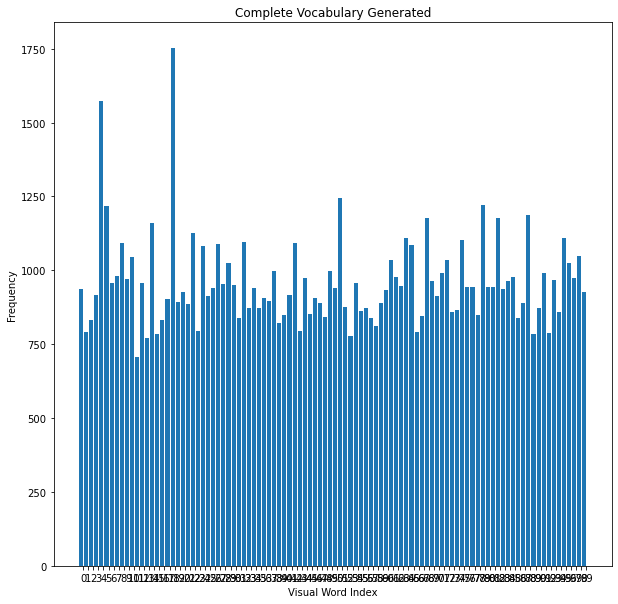

Training SVM
Training completed
 #### Reading image category  aquarium  ##### 
 #### Reading image category  desert  ##### 
 #### Reading image category  highway  ##### 
 #### Reading image category  kitchen  ##### 
 #### Reading image category  laundromat  ##### 
 #### Reading image category  park  ##### 
 #### Reading image category  waterfall  ##### 
 #### Reading image category  windmill  ##### 
processing  aquarium
processing  desert
processing  highway
processing  kitchen
processing  laundromat
processing  park
processing  waterfall
processing  windmill


In [147]:

class BOV:
    def __init__(self, no_clusters):
        self.no_clusters = no_clusters
        self.train_path = None
        self.test_path = None
        self.im_helper = ImageHelpers()
        self.bov_helper = BOVHelpers(no_clusters)
        self.file_helper = FileHelpers()
        self.images = None
        self.trainImageCount = 0
        self.train_labels = np.array([])
        self.name_dict = {}
        self.descriptor_list = []

    def trainModel(self):
        """
        This method contains the entire module 
        required for training the bag of visual words model
        Use of helper functions will be extensive.
        """

        # read file. prepare file lists.
        self.images, self.trainImageCount = self.file_helper.getFiles(self.train_path)
        # extract SIFT Features from each image
        label_count = 0 
        for word, imlist in self.images.items():
            self.name_dict[str(label_count)] = word
            print("Computing Features for ", word)
            for im in imlist:
                self.train_labels = np.append(self.train_labels, label_count)
                kp, des = self.im_helper.features(im)
                self.descriptor_list.append(des)

            label_count += 1


        # perform clustering
        bov_descriptor_stack = self.bov_helper.formatND(self.descriptor_list)
        self.bov_helper.cluster()
        self.bov_helper.developVocabulary(n_images = self.trainImageCount, descriptor_list=self.descriptor_list)

        # show vocabulary trained
        self.bov_helper.plotHist()
 

        self.bov_helper.standardize()
        self.bov_helper.train(self.train_labels)
    def trainModel2(self):
        """
        This method contains the entire module 
        required for training the bag of visual words model
        Use of helper functions will be extensive.
        """

        # read file. prepare file lists.
        self.images, self.trainImageCount = self.file_helper.getFiles(self.train_path)
        # extract SIFT Features from each image
        label_count = 0 
        for word, imlist in self.images.items():
            self.name_dict[str(label_count)] = word
            print("Computing Features for ", word)
            for im in imlist:
                self.train_labels = np.append(self.train_labels, label_count)
                kp, des = self.im_helper.features(im)
                self.descriptor_list.append(des)

            label_count += 1


        # perform clustering
        bov_descriptor_stack = self.bov_helper.formatND(self.descriptor_list)
        self.bov_helper.cluster()
        self.bov_helper.developVocabulary(n_images = self.trainImageCount, descriptor_list=self.descriptor_list)

        # show vocabulary trained
        self.bov_helper.plotHist()
 

        #self.bov_helper.standardize()
        self.bov_helper.train(self.train_labels)


    def recognize2(self,test_img, test_image_path=None):

        """ 
        This method recognizes a single image 
        It can be utilized individually as well.
        """

        kp, des = self.im_helper.features(test_img)
        #print(kp)
        #print(des.shape)

        # generate vocab for test image
        vocab = np.array( [[ 0 for i in range(self.no_clusters)]])
        # locate nearest clusters for each of 
        # the visual word (feature) present in the image
        
        # test_ret =<> return of kmeans nearest clusters for N features
        test_ret = self.bov_helper.kmeans_obj.predict(des)
        # print(test_ret)

        for each in test_ret:
            vocab[0][each] += 1

        #print(vocab)
        # Scale the features
        #vocab = self.bov_helper.scale.transform(vocab)

        # predict the class of the image
        lb = self.bov_helper.clf.predict(vocab)
        #print ("Image belongs to class : ", self.name_dict[str(int(lb[0]))])
        return lb
    def recognize(self,test_img, test_image_path=None):

        """ 
        This method recognizes a single image 
        It can be utilized individually as well.
        """

        kp, des = self.im_helper.features(test_img)
        #print(kp)
        #print(des.shape)

        # generate vocab for test image
        vocab = np.array( [[ 0 for i in range(self.no_clusters)]])
        # locate nearest clusters for each of 
        # the visual word (feature) present in the image
        
        # test_ret =<> return of kmeans nearest clusters for N features
        test_ret = self.bov_helper.kmeans_obj.predict(des)
        # print(test_ret)

        for each in test_ret:
            vocab[0][each] += 1

        #print(vocab)
        # Scale the features
        vocab = self.bov_helper.scale.transform(vocab)

        # predict the class of the image
        lb = self.bov_helper.clf.predict(vocab)
        #print ("Image belongs to class : ", self.name_dict[str(int(lb[0]))])
        return lb



    def testModel(self):
        """ 
        This method is to test the trained classifier
        read all images from testing path 
        use BOVHelpers.predict() function to obtain classes of each image
        """

        self.testImages, self.testImageCount = self.file_helper.getFiles(self.test_path)

        predictions = []

        for word, imlist in self.testImages.items():
            print("processing " ,word)
            for im in imlist:
                #print(imlist[0].shape, imlist[1].shape)
                #print(im.shape)
                cl = self.recognize(im)
                #print(cl)
                predictions.append({
                    'image':im,
                    'class':cl,
                    'object_name':self.name_dict[str(int(cl[0]))]
                    })
        return predictions,self.testImages
    def testModel2(self):
        """ 
        This method is to test the trained classifier
        read all images from testing path 
        use BOVHelpers.predict() function to obtain classes of each image
        """

        self.testImages, self.testImageCount = self.file_helper.getFiles(self.test_path)

        predictions = []

        for word, imlist in self.testImages.items():
            print("processing " ,word)
            for im in imlist:
                #print(imlist[0].shape, imlist[1].shape)
                #print(im.shape)
                cl = self.recognize2(im)
                #print(cl)
                predictions.append({
                    'image':im,
                    'class':cl,
                    'object_name':self.name_dict[str(int(cl[0]))]
                    })
        return predictions,self.testImages
     
        

        


    def print_vars(self):
        pass




bov = BOV(no_clusters=100)

# set training paths
bov.train_path = 'C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/train'
# set testing paths
bov.test_path = 'C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/test' 
# train the model
bov.trainModel()
# test model
predictions,original=bov.testModel()

In [148]:
l=[a_dict['class'] for a_dict in predictions]
l = [arr[0] for arr in l]
o=([0]*20)+[1]*20+[2]*20+[3]*20+[4]*20+[5]*20+[6]*20+[7]*20
print('confusion matrix')
print(confusion_matrix(o, l))
# Accuracy

print(accuracy_score(o, l))

print(classification_report(o, l))

confusion matrix
[[12  1  1  0  1  3  0  2]
 [ 0 13  1  0  2  1  3  0]
 [ 0  4  9  0  5  1  0  1]
 [ 3  1  0  6  7  1  0  2]
 [ 1  1  0  6  9  1  0  2]
 [ 0  0  1  0  0 16  0  3]
 [ 2  0  0  0  0  7 11  0]
 [ 0  3  4  1  1  2  1  8]]
0.525
              precision    recall  f1-score   support

           0       0.67      0.60      0.63        20
           1       0.57      0.65      0.60        20
           2       0.56      0.45      0.50        20
           3       0.46      0.30      0.36        20
           4       0.36      0.45      0.40        20
           5       0.50      0.80      0.62        20
           6       0.73      0.55      0.63        20
           7       0.44      0.40      0.42        20

    accuracy                           0.53       160
   macro avg       0.54      0.53      0.52       160
weighted avg       0.54      0.53      0.52       160



<ipython-input-149-82271341ec1b>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


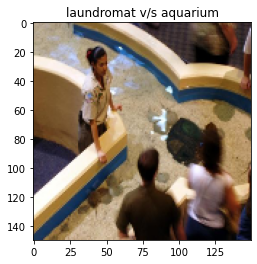

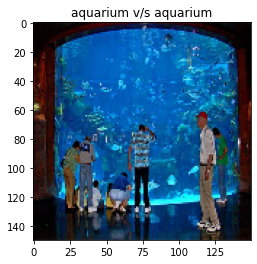

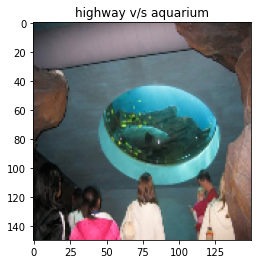

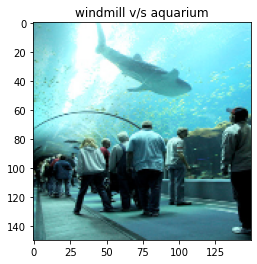

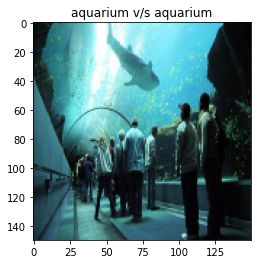

...

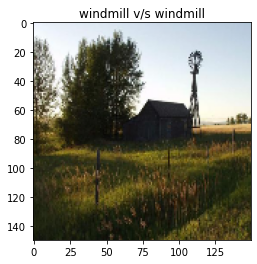

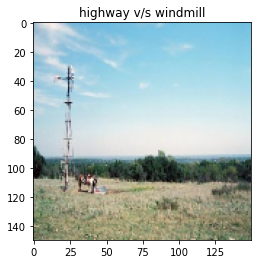

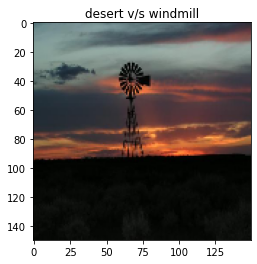

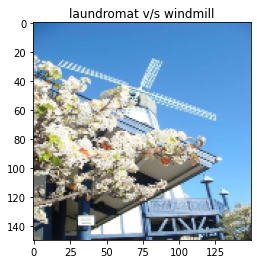

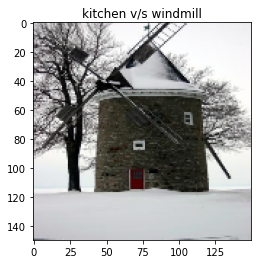

In [149]:
counter=0
for each in glob('C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/test' + "/*"):
            word = each.split("\\")[-1]
            #print(" #### Reading image category ", word, " ##### ")
            for imagefile in glob('C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/test'+'/'+word+"/*"):
                #print("Reading file ", imagefile)
                im = cv2.imread(imagefile)
                im=cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
                im=cv2.resize(im,(150,150))
                plt.figure()
                plt.imshow(im)
                plt.title(predictions[counter]['object_name']+' v/s '+word)
                counter=counter+1

In [151]:

class BOV:
    def __init__(self, no_clusters):
        self.no_clusters = no_clusters
        self.train_path = None
        self.test_path = None
        self.im_helper = ImageHelpers()
        self.bov_helper = BOVHelpers(no_clusters)
        self.file_helper = FileHelpers()
        self.images = None
        self.trainImageCount = 0
        self.train_labels = np.array([])
        self.name_dict = {}
        self.descriptor_list = []

    def trainModel(self):
        """
        This method contains the entire module 
        required for training the bag of visual words model
        Use of helper functions will be extensive.
        """

        # read file. prepare file lists.
        self.images, self.trainImageCount = self.file_helper.getFiles(self.train_path)
        # extract SIFT Features from each image
        label_count = 0 
        for word, imlist in self.images.items():
            self.name_dict[str(label_count)] = word
            print("Computing Features for ", word)
            for im in imlist:
                self.train_labels = np.append(self.train_labels, label_count)
                kp, des = self.im_helper.features(im)
                self.descriptor_list.append(des)

            label_count += 1


        # perform clustering
        bov_descriptor_stack = self.bov_helper.formatND(self.descriptor_list)
        self.bov_helper.cluster()
        self.bov_helper.developVocabulary(n_images = self.trainImageCount, descriptor_list=self.descriptor_list)

        # show vocabulary trained
        self.bov_helper.plotHist()
 

        self.bov_helper.standardize()
        self.bov_helper.train(self.train_labels)
    def trainModel2(self):
        """
        This method contains the entire module 
        required for training the bag of visual words model
        Use of helper functions will be extensive.
        """

        # read file. prepare file lists.
        self.images, self.trainImageCount = self.file_helper.getFiles(self.train_path)
        # extract SIFT Features from each image
        label_count = 0 
        for word, imlist in self.images.items():
            self.name_dict[str(label_count)] = word
            print("Computing Features for ", word)
            for im in imlist:
                self.train_labels = np.append(self.train_labels, label_count)
                kp, des = self.im_helper.features(im)
                self.descriptor_list.append(des)

            label_count += 1


        # perform clustering
        bov_descriptor_stack = self.bov_helper.formatND(self.descriptor_list)
        self.bov_helper.cluster()
        self.bov_helper.developVocabulary(n_images = self.trainImageCount, descriptor_list=self.descriptor_list)

        # show vocabulary trained
        self.bov_helper.plotHist()
 

        #self.bov_helper.standardize()
        self.bov_helper.train(self.train_labels)


    def recognize2(self,test_img, test_image_path=None):

        """ 
        This method recognizes a single image 
        It can be utilized individually as well.
        """

        kp, des = self.im_helper.features(test_img)
        #print(kp)
        #print(des.shape)

        # generate vocab for test image
        vocab = np.array( [[ 0 for i in range(self.no_clusters)]])
        # locate nearest clusters for each of 
        # the visual word (feature) present in the image
        
        # test_ret =<> return of kmeans nearest clusters for N features
        test_ret = self.bov_helper.kmeans_obj.predict(des)
        # print(test_ret)

        for each in test_ret:
            vocab[0][each] += 1

        #print(vocab)
        # Scale the features
        #vocab = self.bov_helper.scale.transform(vocab)

        # predict the class of the image
        lb = self.bov_helper.clf.predict(vocab)
        #print ("Image belongs to class : ", self.name_dict[str(int(lb[0]))])
        return lb
    def recognize(self,test_img, test_image_path=None):

        """ 
        This method recognizes a single image 
        It can be utilized individually as well.
        """

        kp, des = self.im_helper.features(test_img)
        #print(kp)
        #print(des.shape)

        # generate vocab for test image
        vocab = np.array( [[ 0 for i in range(self.no_clusters)]])
        # locate nearest clusters for each of 
        # the visual word (feature) present in the image
        
        # test_ret =<> return of kmeans nearest clusters for N features
        test_ret = self.bov_helper.kmeans_obj.predict(des)
        # print(test_ret)

        for each in test_ret:
            vocab[0][each] += 1

        #print(vocab)
        # Scale the features
        vocab = self.bov_helper.scale.transform(vocab)

        # predict the class of the image
        lb = self.bov_helper.clf.predict(vocab)
        #print ("Image belongs to class : ", self.name_dict[str(int(lb[0]))])
        return lb



    def testModel(self):
        """ 
        This method is to test the trained classifier
        read all images from testing path 
        use BOVHelpers.predict() function to obtain classes of each image
        """

        self.testImages, self.testImageCount = self.file_helper.getFiles(self.test_path)

        predictions = []

        for word, imlist in self.testImages.items():
            print("processing " ,word)
            for im in imlist:
                #print(imlist[0].shape, imlist[1].shape)
                #print(im.shape)
                cl = self.recognize(im)
                #print(cl)
                predictions.append({
                    'image':im,
                    'class':cl,
                    'object_name':self.name_dict[str(int(cl[0]))]
                    })
        return predictions,self.testImages
    def testModel2(self):
        """ 
        This method is to test the trained classifier
        read all images from testing path 
        use BOVHelpers.predict() function to obtain classes of each image
        """

        self.testImages, self.testImageCount = self.file_helper.getFiles(self.test_path)

        predictions = []

        for word, imlist in self.testImages.items():
            print("processing " ,word)
            for im in imlist:
                #print(imlist[0].shape, imlist[1].shape)
                #print(im.shape)
                cl = self.recognize2(im)
                #print(cl)
                predictions.append({
                    'image':im,
                    'class':cl,
                    'object_name':self.name_dict[str(int(cl[0]))]
                    })
        return predictions,self.testImages
     
        

        


    def print_vars(self):
        pass




 #### Reading image category  aquarium  ##### 
 #### Reading image category  desert  ##### 
 #### Reading image category  highway  ##### 
 #### Reading image category  kitchen  ##### 
 #### Reading image category  laundromat  ##### 
 #### Reading image category  park  ##### 
 #### Reading image category  waterfall  ##### 
 #### Reading image category  windmill  ##### 
Computing Features for  aquarium
Computing Features for  desert
Computing Features for  highway
Computing Features for  kitchen
Computing Features for  laundromat
Computing Features for  park
Computing Features for  waterfall
Computing Features for  windmill
Vocabulary Histogram Generated
Plotting histogram


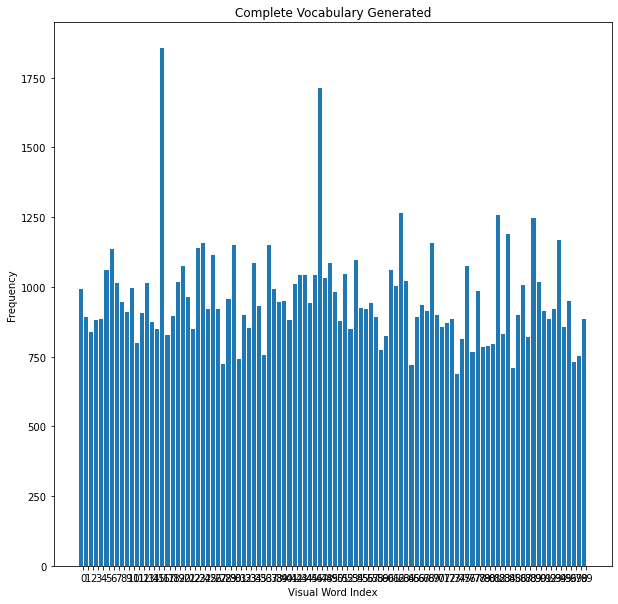

Training SVM
Training completed
 #### Reading image category  aquarium  ##### 
 #### Reading image category  desert  ##### 
 #### Reading image category  highway  ##### 
 #### Reading image category  kitchen  ##### 
 #### Reading image category  laundromat  ##### 
 #### Reading image category  park  ##### 
 #### Reading image category  waterfall  ##### 
 #### Reading image category  windmill  ##### 
processing  aquarium
processing  desert
processing  highway
processing  kitchen
processing  laundromat
processing  park
processing  waterfall
processing  windmill
confusion matrix
[[11  1  1  2  0  4  0  1]
 [ 1 14  0  0  1  1  2  1]
 [ 1  3  9  1  2  2  0  2]
 [ 2  1  0  8  7  1  0  1]
 [ 0  2  1  5  9  1  1  1]
 [ 1  0  0  0  2 15  0  2]
 [ 2  0  0  0  0 11  6  1]
 [ 0  2  5  1  1  3  1  7]]
0.49375
              precision    recall  f1-score   support

           0       0.61      0.55      0.58        20
           1       0.61      0.70      0.65        20
           2       0.56      

In [152]:
bov = BOV(no_clusters=100)

# set training paths
bov.train_path = 'C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/train'
# set testing paths
bov.test_path = 'C:/Users/91709/Desktop/CV/assignment-4-rez39/dataset/SUN_data/test' 
# train the model
bov.trainModel2()
# test model
predictions,original=bov.testModel2()
l=[a_dict['class'] for a_dict in predictions]
l = [arr[0] for arr in l]
o=([0]*20)+[1]*20+[2]*20+[3]*20+[4]*20+[5]*20+[6]*20+[7]*20
print('confusion matrix')
print(confusion_matrix(o, l))
# Accuracy

print(accuracy_score(o, l))

print(classification_report(o, l))